[*] load ckpt from /home/tk/.virtualenvs/dev-python-3.7/lib/python3.7/site-packages/cltl_face_all/arcface/./pretrained_models/arc_res50/e_8_b_40000.ckpt


/home/tk/.virtualenvs/dev-python-3.7/lib/python3.7/site-packages/cltl_face_all/face_alignment/matlab_cp2tform.py:84: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  r, _, _, _ = lstsq(X, U)


number of faces in this frame: 6
number of faces in this frame: 7
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 7
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 6
number of faces in this frame: 5



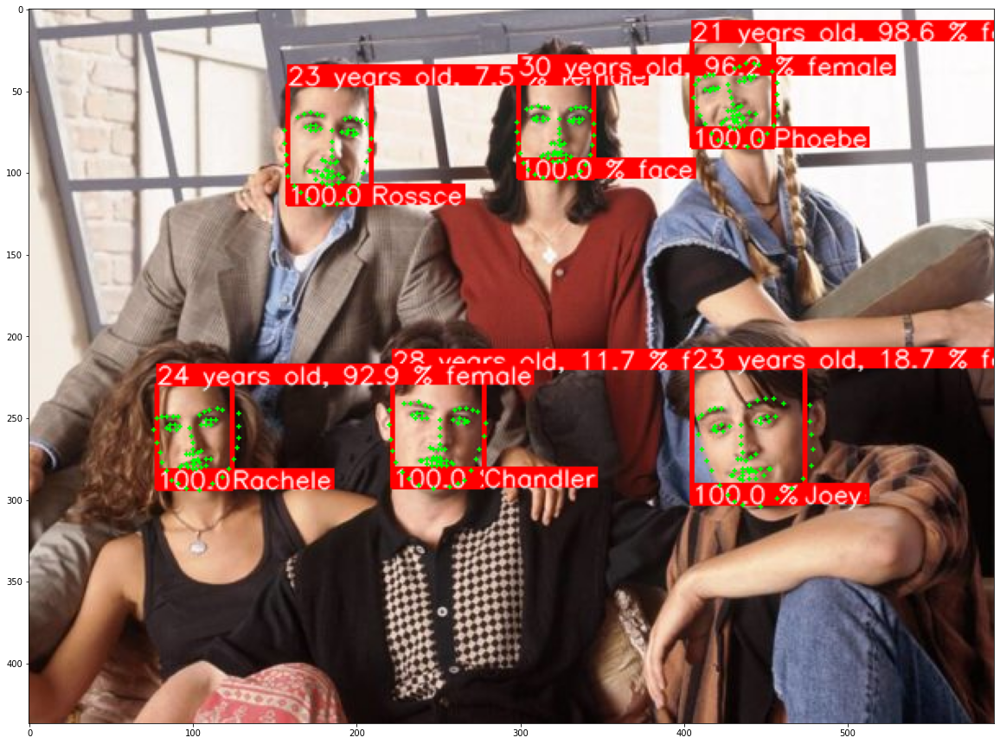

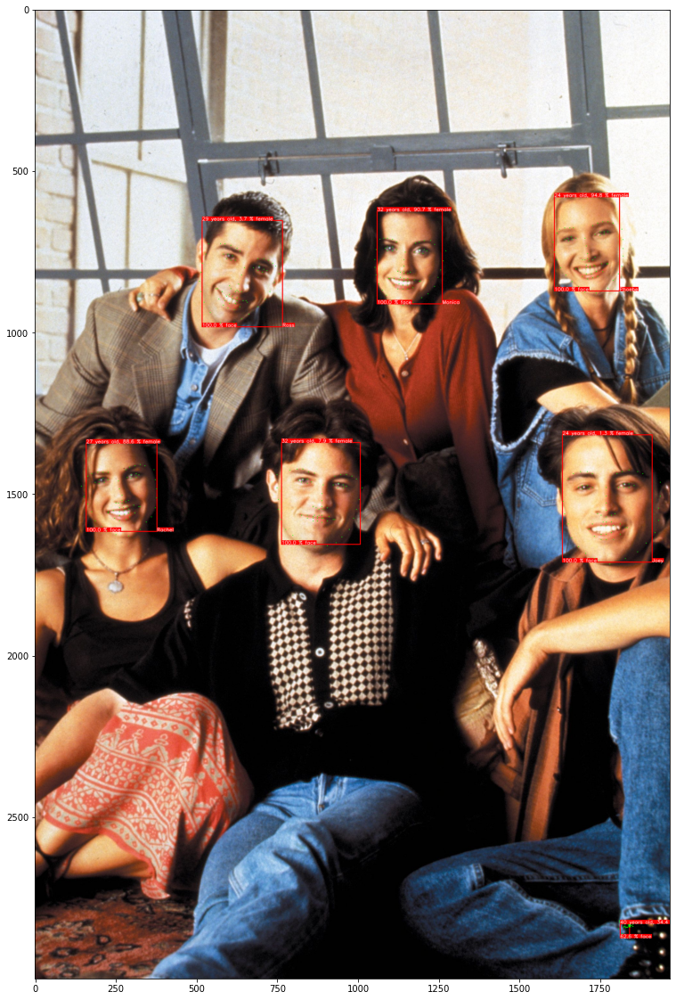

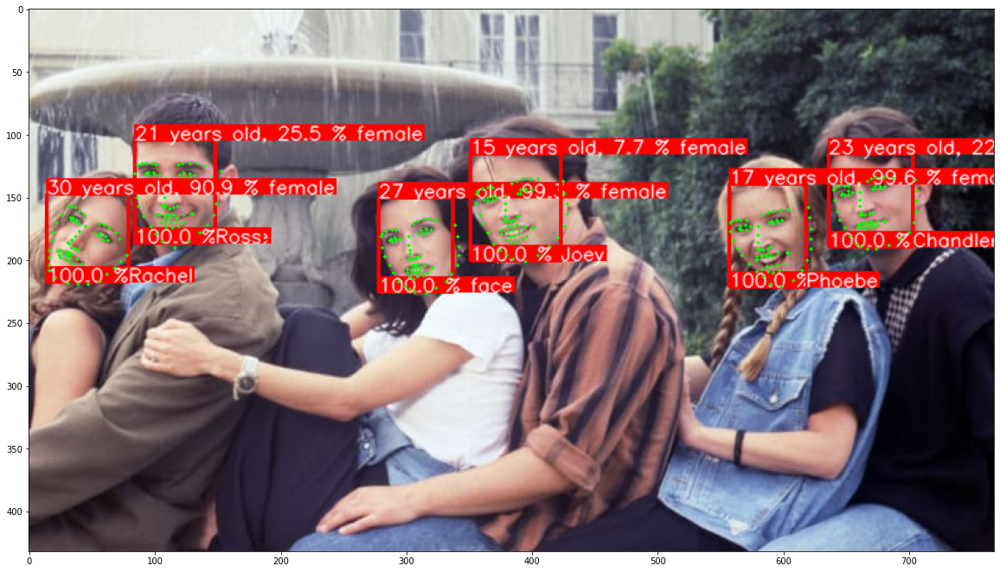

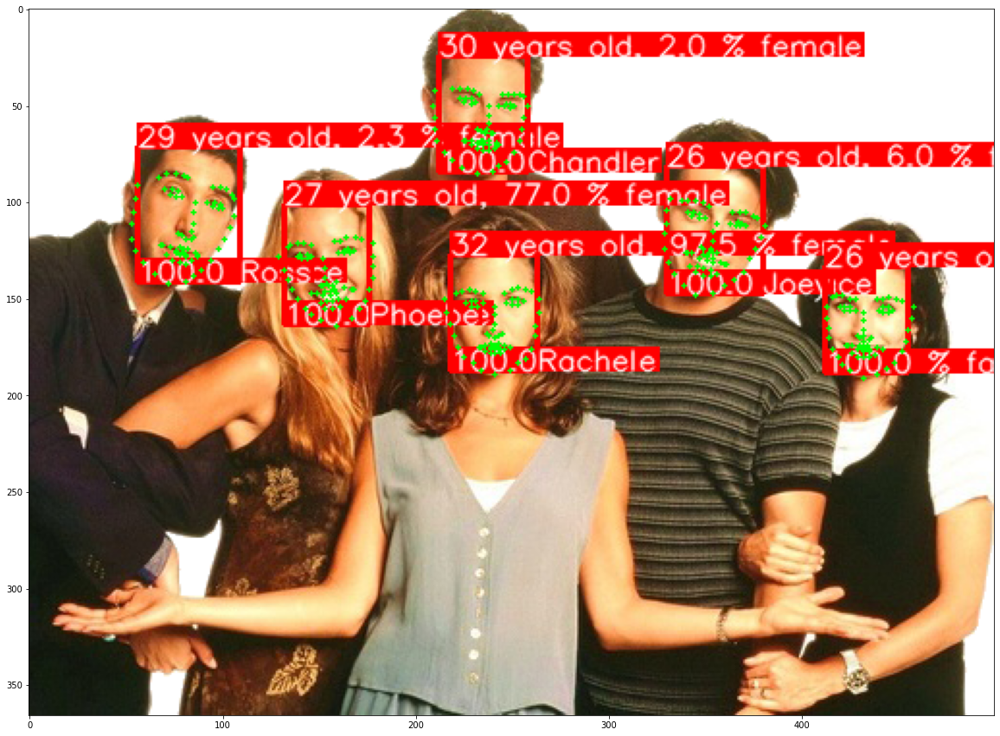

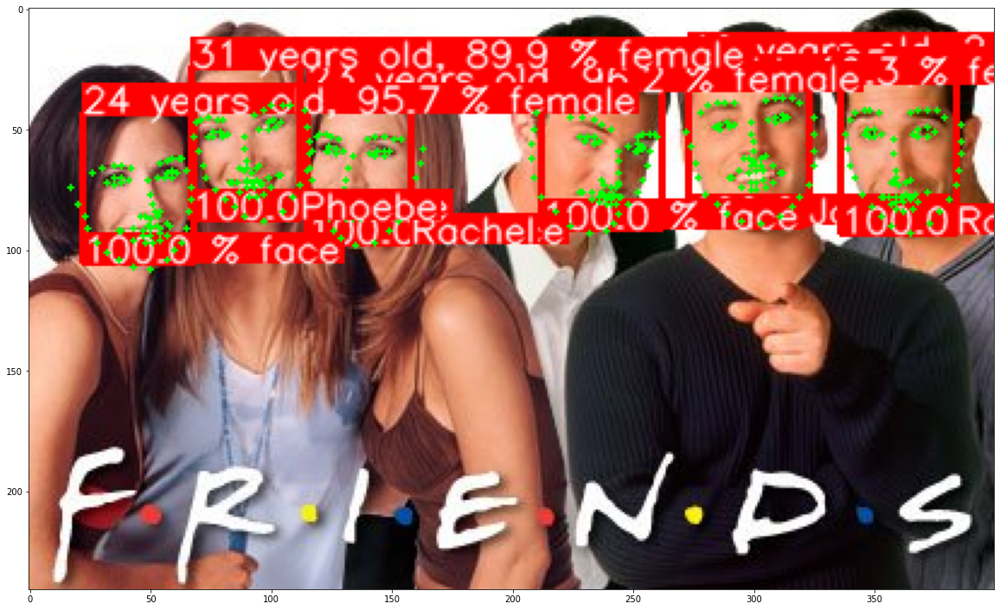

...

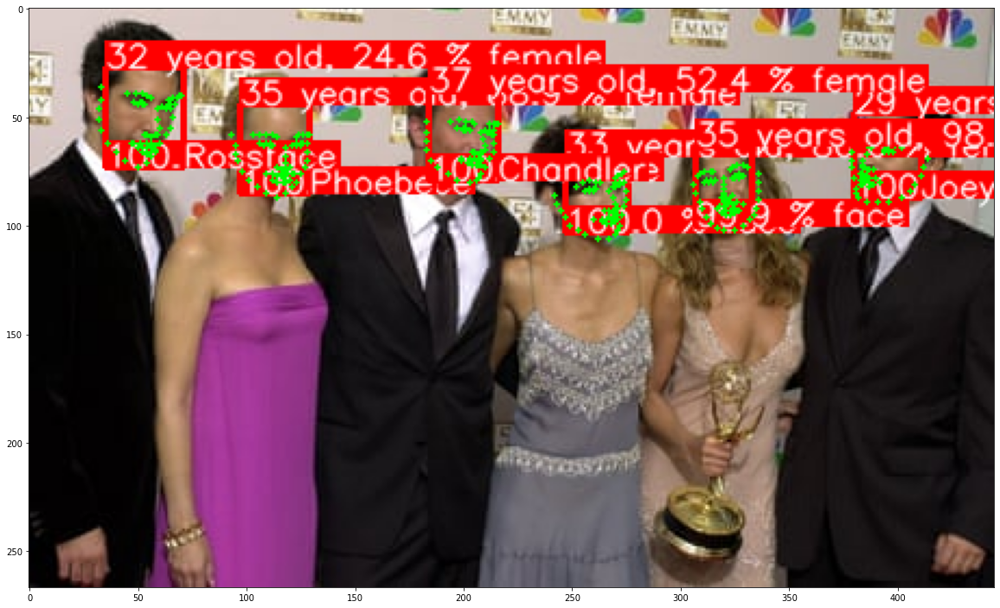

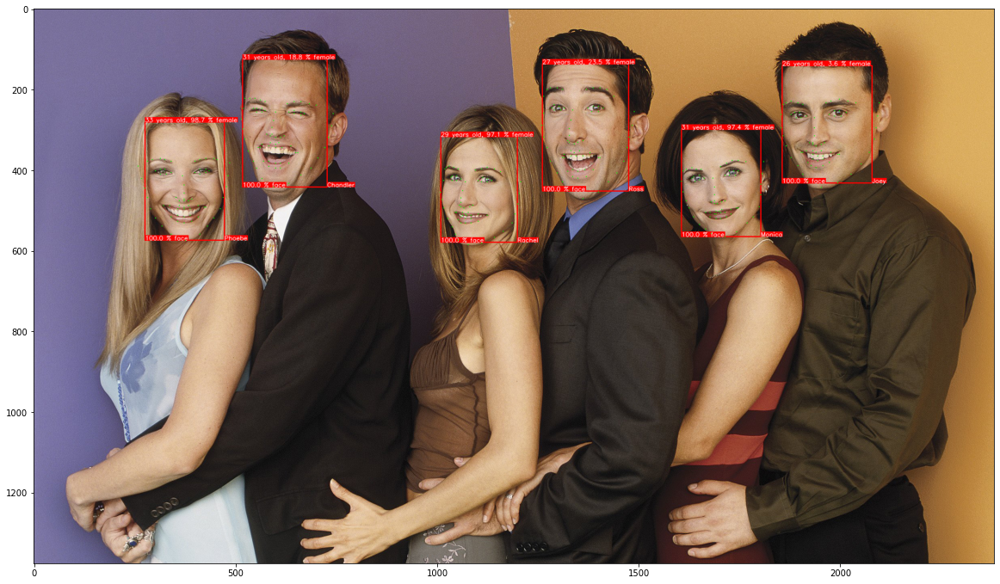

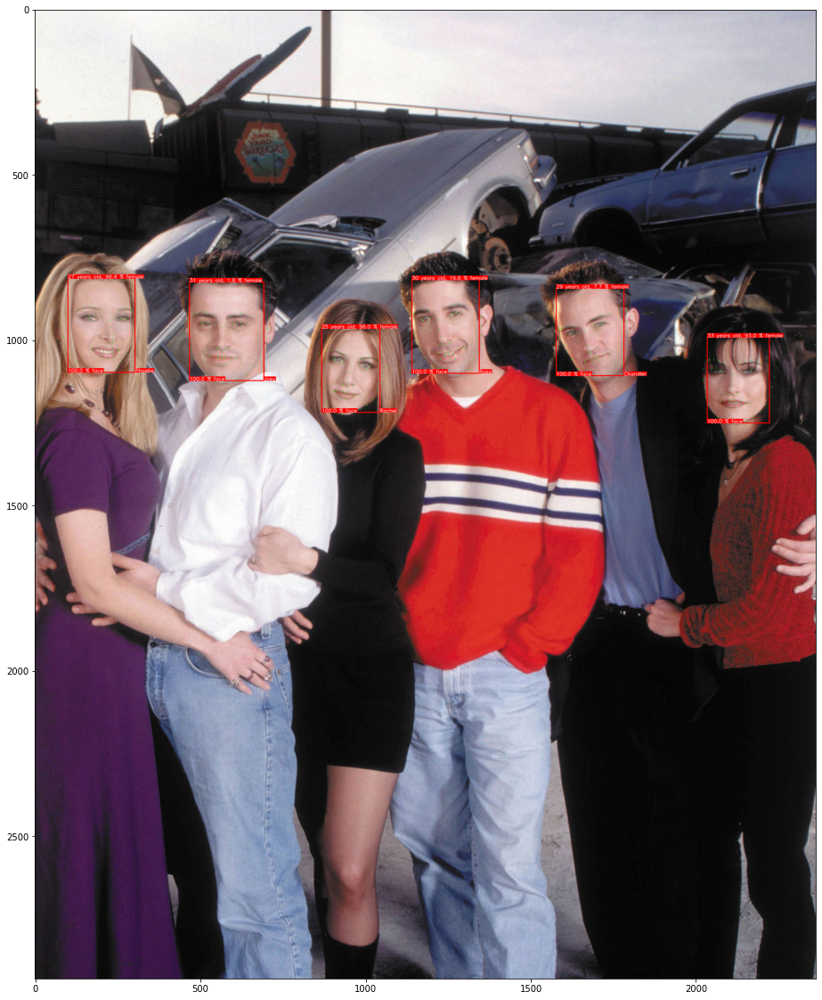

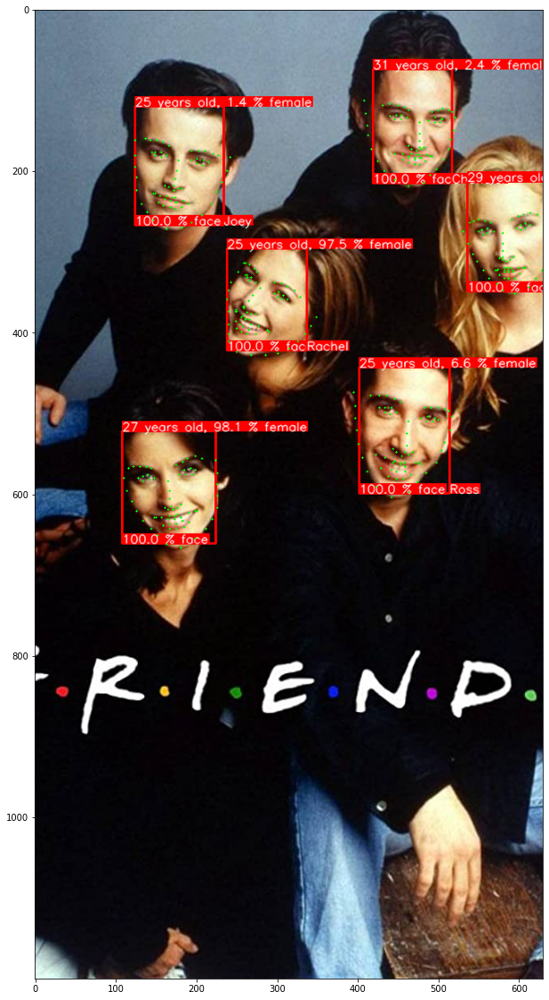

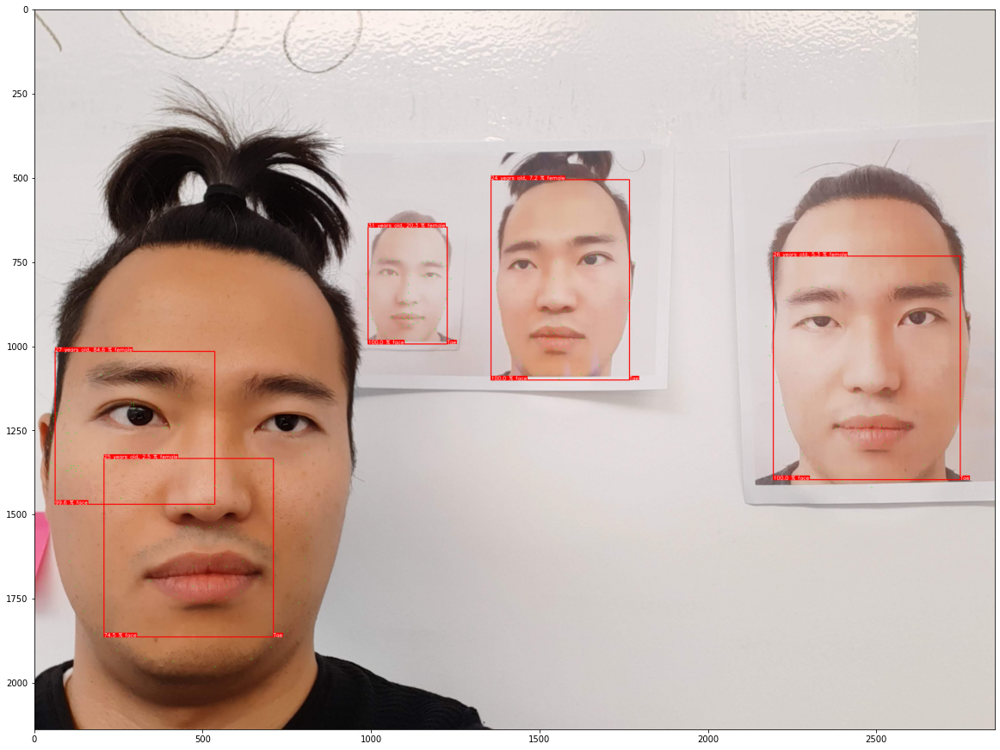

In [1]:
from glob import glob
import cv2
from cltl_face_all.agegender import AgeGender
from cltl_face_all.arcface import ArcFace
from cltl_face_all.arcface import calc_angle_distance
from cltl_face_all.face_alignment import FaceDetection
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm


def draw_label(image, point, label, font=cv2.FONT_HERSHEY_SIMPLEX,
               font_scale=0.8, thickness=1):
    size = cv2.getTextSize(label, font, font_scale, thickness)[0]
    x, y = point
    cv2.rectangle(image, (x, y - size[1]), (x + size[0], y), (255, 0, 0), cv2.FILLED)
    cv2.putText(image, label, point, font, font_scale, (255, 255, 255), thickness, lineType=cv2.LINE_AA)


HERE = os.getcwd()

face_threshold = 0.85
existing_embs_ = glob(os.path.join(HERE, f'../your-faces/*.npy'))
existing_embs = []
existing_names = []

for ee_ in existing_embs_:
    existing_names.append(os.path.basename(ee_).split('.npy')[0])
    existing_embs.append(np.load(ee_).reshape(1, 512))

existing_embs  = np.concatenate(existing_embs, axis=0)


ag = AgeGender(device='cpu')
af = ArcFace(device='cpu')
fd = FaceDetection(device='cpu', face_detector='sfd')

pictures = glob('/home/tk/repos/cltl-face-all/sample-pictures/*')

for pic in tqdm(pictures):
    img_BGR = cv2.imread(pic)
    img = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

    bboxes = fd.detect_faces(img[np.newaxis, ...])
    landmarks = fd.detect_landmarks(img[np.newaxis, ...], bboxes)
    faces = fd.crop_and_align(img[np.newaxis, ...], bboxes, landmarks)

    # There is only one image per batch. fd returns a list
    bbox = bboxes[0]
    landmark = landmarks[0]
    face = faces[0]

    face_threshold = 0.85

    if len(bbox) > 0:
        print(f"number of faces in this frame: {len(bbox)}")

        # ag and af return a np.ndarray
        age, gender = ag.predict(face)
        embeddings = af.predict(face)

        for bb, lm, a, g, emb in zip(bbox, landmark, age, gender, embeddings):
            x1, y1, x2, y2, prob = bb
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

            label = f"{str(round(prob*100, 1))} % face"
            draw_label(img, (x1, y2), label, font_scale=0.5, thickness=1)

            for lm in landmark:
                for xy in lm:
                    cv2.circle(img, (int(xy[0]), int(xy[1])), 1, (0,255,0), -1)

            label = f"{int(a)} years old, {str(round(g*100, 1))} % female"
            draw_label(img, (x1, y1), label, font_scale=0.5, thickness=1)

            emb = emb.reshape(1, 512)
            dists = calc_angle_distance(emb, existing_embs)

            candidate, dist = existing_names[np.argmin(dists)], np.min(dists)
            angle_dist_threshold = 1.0
            if dist < angle_dist_threshold:
                label = f"{candidate}"
                draw_label(img, (x2, y2), label, font_scale=0.5, thickness=1)
    plt.figure(figsize=(20,20))
    plt.imshow(img)